In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import glob
from astropy.io import fits
from matplotlib import colors

import umap

import pandas as pd
from scipy.spatial import cKDTree

from matplotlib import cm
cmap = cm.tab10

plt.rcParams['font.size'] = 18

In [2]:
basePaths = glob.glob('../../repdim*/')
basePaths.sort()
# for path in basePaths:
#     if not glob.glob(path+'postprocessing/repres*npy'):
#         print(path)
basePaths

['../../repdim=1-projdim=1/',
 '../../repdim=128-projdim128/',
 '../../repdim=128-projdim16/',
 '../../repdim=128-projdim2/',
 '../../repdim=128-projdim64/',
 '../../repdim=128-projdim8/',
 '../../repdim=16/',
 '../../repdim=2-projdim2/',
 '../../repdim=4-projdim4/',
 '../../repdim=64-projdim16/',
 '../../repdim=64-projdim64/',
 '../../repdim=8/']

In [3]:
import pandas as pd
from sklearn.utils import shuffle

#Set seed
SEED = 0

#Plot a single UMAP of x with color c
def create_umap(x, n_neighbors=50, min_dist=0.1, n_components=2, metric='euclidean'):
    fit = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        metric=metric,
        densmap=False,
        random_state=SEED
    )
    u = fit.fit_transform(x);
    
    return np.array(u)
        

n_neighbors = [10, 50, 100]
min_dist = [0.1, 0.5, 1]

for n in n_neighbors:
    for dist in min_dist:
        try:
            u = create_umap(rep, n_neighbors=n, min_dist=dist)
            d = {'u_0': u[:,0], 'u_1': u[:,1], 'dataset': df['dataset']}
            plt.title('n_neighbors = ' + str(n) + ' ' + 'min_dist = ' + str(dist))
            sns.kdeplot(data=pd.DataFrame(d), x='u_0', y='u_1', hue="dataset")
            plt.show()
        except:
            print('n_neighbors = ' + str(n) + ' ' + 'min_dist = ' + str(dist) + ' failed!')

In [4]:
def get_umap(basePath, suffix='', n_neighbors=100, min_dist=0.5):
    with open(basePath+'postprocessing/representation%s.npy' % suffix, 'rb') as f:
        rep = np.load(f)
    u = create_umap(rep, n_neighbors=n_neighbors, min_dist=min_dist)
    return u

def plot_kde(u, df, palette = {'fiducial': cmap(0)}, key='fiducial', ax = None, imname = "../../temp/kde.pdf"):
    d = {'u_0': u[:,0], 'u_1': u[:,1], 'Dataset': np.array([key]*len(df))}
    d = pd.DataFrame(d)
#     print(d)
    
    #TNG vs all HSC
    g = sns.kdeplot(data=d, x='u_0', y='u_1', hue="Dataset", palette=palette, common_norm=False, levels = 7, ax=ax)
    g.get_legend().set_title(None)
    ax = plt.gca()
    ax.axis('off')
    g.get_figure().savefig(imname) 
    plt.show()

from matplotlib import cm
cmap = cm.tab10

def get_name(basePath):
    try:
        name = basePath.split('../../')[1].split('/')[0]
    except IndexError:
        name = 'fiducial'
    return name
    

/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


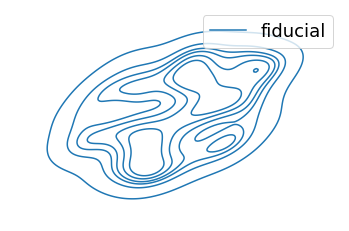

In [6]:
u = get_umap('../../repdim=8/', n_neighbors=50, min_dist=0.25)
plot_kde(u, df)

In [50]:
# reference = pd.read_csv('../../physical_properties.csv')
reference.to_csv('../../physical_properties.csv', index=False)

In [11]:
import illustris_python as il

halos = il.groupcat.loadHalos('/virgotng/mpia/TNG-Cluster/TNG-Cluster/output/', 99, fields=['Group_M_Crit500', 'GroupPrimaryZoomTarget'])


In [16]:
m500c = halos['Group_M_Crit500'][np.argwhere(halos['GroupPrimaryZoomTarget'])[:,0]]
m500c_sort_ind = np.argsort(m500c)

0.26360180739492894 0.26351155340671534


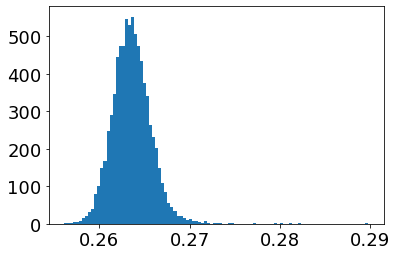

In [41]:
light_in_r200c = reference['light_in_r200c']
_ = plt.hist(light_in_r200c, bins=100)
print(np.mean(light_in_r200c), np.median(light_in_r200c))

import illustris_python as il
halos99 = il.groupcat.loadHalos('/virgotng/mpia/TNG-Cluster/TNG-Cluster/output/',
                              99, fields=['GroupOrigHaloID', 'GroupPrimaryZoomTarget'])
halo_ind99 = halos99['GroupOrigHaloID'][np.argwhere(halos99['GroupPrimaryZoomTarget'])]

halo_ind99 = halo_ind99[:,0]

halo_index = np.zeros(len(reference))
for i in range(len(reference)):
    halo = il.groupcat.loadSingle('/virgotng/mpia/TNG-Cluster/TNG-Cluster/output/', reference['snapshot_id'][i].astype(int),
                                 haloID=reference['halo_num'][i].astype(int))
    halo_index[i] = np.argwhere(halo_ind99 == halo['GroupOrigHaloID'])[0][0] 
    if not np.mod(i,100):
        print(i)

In [21]:
label_raw_dict = {'z': 'Redshift',
                    'm200c': r'M$_{200c}$ [$M_\odot$]', 
                    'stellar_mass': r'$M_*$ [$M_\odot$]',
                    'gas_mass': r'$M_{gas}$ [$M_\odot$]',
                    'bh_mass': r'$M_\bullet$ [$M_\odot$]',
                    # 'm500c': r'M$_{500c}$ [$M_\odot$]', 
                    'bh_accr': r'BHAR [$M_\odot/Gyr$]',
                    # 'bh_einj_cum': r'$E_{inj, cum} (Tot)$ [erg]',
                    'bh_tinj_cum': r'$E_{therm, cum} $ [erg]', 
                    'bh_kinj_cum': r'$E_{kin, cum}$ [erg]', 
                    'sfr': r'SFR [$M_\odot/yr$]',
                    'time_since_last_major_merger': r't$_{merge, FoF}$ (R > 0.2)', 
                    'sublink_tmerge_major': 't$_{merge, BCG}$',
                    'centralCoolingTime': r't$_{cool,c}$ (Gyr)',
                    'central_ne': r'$n_e ( r = 0)$',
                    'slope_ne': r'$\alpha_e (r = 0)$',
                    'Cphys': r'$C_{\rm phys}$'}

label_raw_list = [key for key in label_raw_dict.keys()]
print(len(label_raw_list))

15


In [22]:
label_human_dict = {'m200c': r'M$_{200c}$ [$M_\odot$]', 
                    'f_star': r'$M_*/M_{200c}$',
                    'f_gas': r'$M_{gas}/M_{200c}$',
                    'd_bh_mass': r'$M_\bullet/M_{200c}$',
                    'f_Edd': r'$\lambda_{Edd}$',
                    'd_bh_tinj_cum': r'$E_{therm, cum} (M_{200c})$', 
                    'd_bh_kinj_cum': r'$E_{kin, cum}(M_{200c})$', 
                    'ssfr': r'sSFR',
                    'Cscale': r'$C_{\rm scale}$',
                    'd_Lx_r200c': '$\Delta L_X (< r_{200c})$',
                    'Mass_Criterion': '$M_{FirstSub}/M_{FoF}$',
                    'Distance_Criterion': 'COM Offset'}

label_list = [key for key in label_human_dict.keys()]
print(len(label_list))

12


In [23]:
def add_data(df, reference=reference):
    allkeys = reference.keys()
    for key in allkeys:
        # print(key)
        if key not in df.keys():
            # print('adding', key)
            ncol = len(df.keys())
            df.insert(ncol, key, np.zeros(len(df)))
            index = [i for i in df.index]
            for i in index:
                mask = (reference['snapshot_id'] == df['snapshot_id'][i]) * (reference['subhalo_id'] == df['subhalo_id'][i])
                df[key].values[index.index(i)] = reference[key].values[mask][0]
            # print(key, 'done')

In [24]:
#i need to think clearly about what quantities to log and what not

def log_columns(df):
    for column in df.columns:
        if ('f_Edd' in column) or ('sfr' in column) or ('mass' in column) or ('m200c' in column) or ('accr' in column) or ('inj' in column):
                val0 = df[column].values
                df[column] = np.log10(val0)

In [31]:
df = pd.read_csv('../../fiducial/dataset/m_test.csv')
add_data(df)
log_columns(df)
u = get_umap('../../repdim=8/', n_neighbors=50, min_dist=0.25, suffix='')

/tmp/ipykernel_19399/2443099504.py:7: RuntimeWarning: invalid value encountered in log10
  df[column] = np.log10(val0)
/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


(-0.1, 4.0)

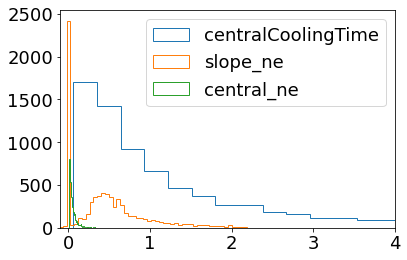

In [20]:
for key in reference.keys():
    if (('central' in key) or ('slope' in key)) and ('d_' not in key):
        prop = reference[key]
        plt.hist(prop, bins=50, range=(np.nanpercentile(prop, 1), np.nanpercentile(prop, 99)), label=key, histtype='step')
plt.legend()
plt.xlim(-0.1,4)

In [17]:
cat = reference
snaps = np.unique(cat['snapshot_id'])
# log_columns(cat)

def plot_prop(cat, label, colorind, cmap = cm.tab10, ax=None, lowpc=16, highpc=84):
    if not ax:
        fig, ax = plt.subplots()
    else:
        fig = ax.get_figure()

    mean = np.zeros(len(snaps))
    median = np.zeros(len(snaps))
    pc16 = np.zeros(len(snaps))
    pc84 = np.zeros(len(snaps))
    for snap in snaps:
        sub = cat[cat['snapshot_id'] == snap]
        i = np.argwhere(snaps == snap)[0][0]
        prop = sub[label]
        mean[i] = np.nanmean(prop)
        median[i] = np.nanmedian(prop)
        pc16[i] = np.nanpercentile(prop, lowpc)
        pc84[i] = np.nanpercentile(prop, highpc)
    
    ax.plot(snaps, median, c=cmap(colorind), label=label)
    ax.plot(snaps, mean, c=cmap(colorind), linestyle='dotted')
    ax.fill_between(snaps, pc16, pc84, color=cmap(colorind), alpha=0.3)
    return fig, ax

NameError: name 'cat' is not defined

In [23]:
for key in label_list:
    prop = cat[key]
    print(key, ':', np.nanpercentile(prop, 5), np.nanpercentile(prop, 95))

z : 0.0 0.997294
m200c : 13.892098592130665 15.09208991311126
f_star : -2.376880697258675 -1.8197820242067388
f_gas : -0.9484176924938392 -0.7327726433258734
d_bh_mass : -5.326355908342093 -4.642177853656838
f_Edd : -4.262298420607505 -1.7819829921105634
d_bh_tinj_cum : -1.77073349819381 -0.4874956423797858
d_bh_kinj_cum : -1.6349464447152124 -0.3483959200951984
ssfr : -15.025040827701975 -10.877421899228557
time_since_last_major_merger : 0.3951792961122257 8.686349331301946
sublink_tmerge_major : 0.0995721047051221 7.607794586950158
centralCoolingTime : 0.1332957216668249 7.261473533027231
central_ne : 0.005940545350313125 0.1621167212724685
slope_ne : 0.0 1.493037223815918
Distance_Criterion : 0.04562991838902231 1.2549999952316284


In [46]:
#Prepare the data for the plotting
vmin = {}#'z':0, 'centralCoolingTime':0.2, 'Distance_Criterion':0.1, 'time_since_last_major_merger': 0.5, 
#         'f_star':-2.4, 'f_gas':-1, 'm200c':14, 'd_bh_mass':-5.3, 'f_Edd':-4.2, 'ssfr': -15.0,
#         'd_bh_tinj_cum': -1.8, 'd_bh_kinj_cum': -1.6, 'sublink_tmerge_major':0, 'centralCoolingTime': 0.1,
#         'slope_ne': 0.0, 'central_ne': 0.01 }
vmax = {}#'z':1, 'centralCoolingTime':3.0, 'Distance_Criterion':1, 'time_since_last_major_merger': 7.5, 
#         'f_star':-1.8, 'f_gas':-0.7, 'm200c':15, 'd_bh_mass':-4.6, 'f_Edd':-1.7, 'ssfr': -10.8, 
#         'd_bh_tinj_cum': -0.5, 'd_bh_kinj_cum': -0.3, 'sublink_tmerge_major':4, 'centralCoolingTime': 5,
#        'slope_ne': 1.5, 'central_ne': 0.16}
gridsize = 10
palette = {}
for basePath in basePaths:
    name = get_name(basePath)
    palette[name] = cmap(basePaths.index(basePath))

def get_hexbin(df, label, axis, u, gridsize, show=True, statistic=np.nanmedian, set_cbar = True, cmap=cm.RdBu):
    C = df[label]
    
    if set_cbar:
        try:
            im = axis.hexbin(u[:,0],u[:,1], 
                   C=C,
                   gridsize=gridsize,
                   mincnt=1, #else empty hexbins
                   reduce_C_function=statistic,
                        vmin = vmin[label],
                        vmax = vmax[label],
                            cmap = cmap)
        except KeyError:
            im = axis.hexbin(u[:,0],u[:,1], 
                   C=C,
                   gridsize=gridsize,
                   mincnt=1, #else empty hexbins
                   reduce_C_function=statistic,
                            vmin = np.nanpercentile(C, 16),
                            vmax = np.nanpercentile(C, 84),
                            cmap = cmap)
    else:
        im = axis.hexbin(u[:,0],u[:,1], 
                   C=C,
                   gridsize=gridsize,
                   mincnt=1, #else empty hexbins
                   reduce_C_function=statistic,
                        vmin = np.nanpercentile(C, 16),
                        vmax = np.nanpercentile(C, 84),
                        cmap = cmap)
    if not show:
        plt.close()
    return im

def plot_umaps(basePath, axis_column, fig, gridsize, label_dict, imname, colorbar=False,  
               nneighbours=100, mindist = 0.5, suffix='', snapnum=None, reference=reference,
               statistic=np.nanmedian, set_cbar=True, nind=15):
    name = get_name(basePath)

    label_list = [key for key in label_dict.keys()]

    if not suffix:
        df = pd.read_csv(basePath+'/dataset/m_test.csv')
    else:
        df = pd.read_csv(basePath+'/dataset/m%s.csv' % suffix)
    print(basePath)
    try:
        u = get_umap(basePath, n_neighbors=nneighbours, min_dist=mindist, suffix=suffix)
    except:
        u = get_umap(basePath, n_neighbors=nneighbours, min_dist=mindist, suffix='_test')

    add_data(df, reference=reference)
    log_columns(df)

    
    u = u[df.index]
        
    #snap and property masks
    if snapnum:
        mask = (df['snapshot_id'].values.astype(int) == snapnum)
        df = df[mask]
        u = u[mask]
    
    i = 0
    for label in label_list[:nind]:
        im = get_hexbin(df, label, axis_column[i], u, gridsize=gridsize, statistic=statistic, set_cbar=set_cbar) 
        
        if colorbar:
            plt.colorbar(im, label=label_dict[label], ax = axis_column[i], aspect=10)
        axis_column[i].axis('off')
        if not i:
            axis_column[i].set_title(name)#, transform=axis_column[i].transAxes)
        plt.tight_layout(rect=(0,0.1,1,1))
        fig.savefig(imname)
        i += 1
    ymin, ymax = axis_column[0].get_ylim()
    dx = ymax-ymin
    axis_column[0].set_ylim(ymin - (0.1*dx), ymax + (0.1*dx))
    plt.show()

../../repdim=8/


/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/tmp/ipykernel_18271/2443099504.py:7: RuntimeWarning: invalid value encountered in log10
  df[column] = np.log10(val0)


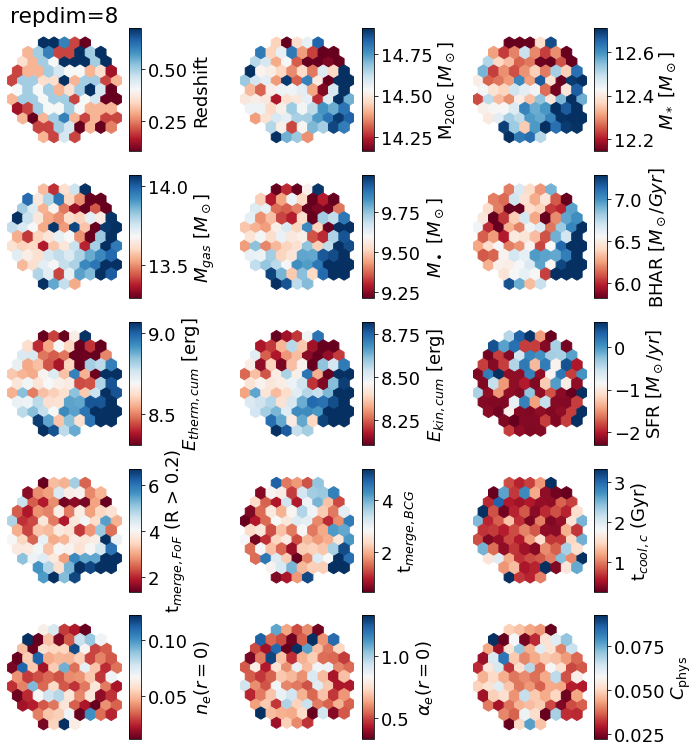

In [47]:
fig, ax = plt.subplots(nrows = 5, ncols = 3, sharex = True, sharey = True, figsize = (10,12))
plot_umaps('../../repdim=8/', ax.flatten(), fig, gridsize, label_raw_dict, colorbar = True, nneighbours=50, 
           mindist=0.75, imname = '../../temp/umap_8dim_nn50_md075.pdf', suffix="")

../../repdim=8/


/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/tmp/ipykernel_18271/2443099504.py:7: RuntimeWarning: invalid value encountered in log10
  df[column] = np.log10(val0)


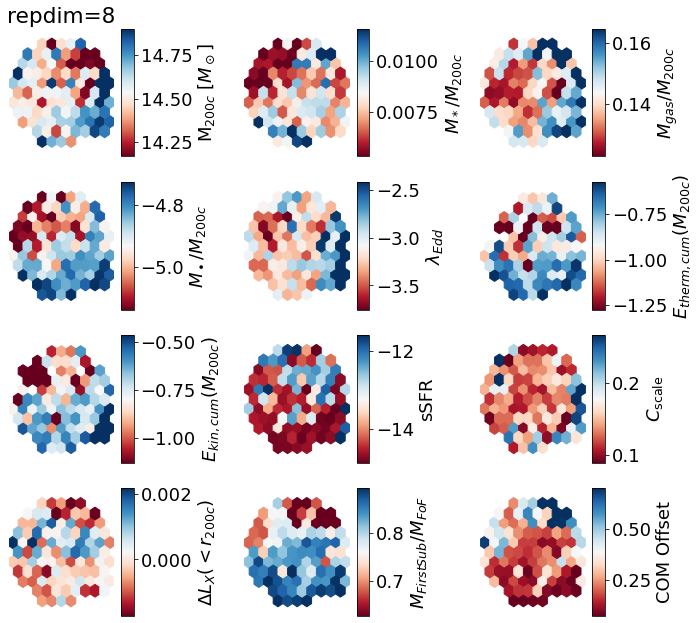

In [48]:
fig, ax = plt.subplots(nrows = 4, ncols = 3, sharex = True, sharey = True, figsize = (10,10))
plot_umaps('../../repdim=8/', ax.flatten(), fig, gridsize, label_human_dict, colorbar = True, nneighbours=50, mindist=0.75,
           imname = '../../temp/umap_8dim_mnorm_nn50_md075.pdf', suffix="", nind=12)

../../repdim=8/


/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/tmp/ipykernel_18271/2443099504.py:7: RuntimeWarning: divide by zero encountered in log10
  df[column] = np.log10(val0)
/tmp/ipykernel_18271/2443099504.py:7: RuntimeWarning: invalid value encountered in log10
  df[column] = np.log10(val0)


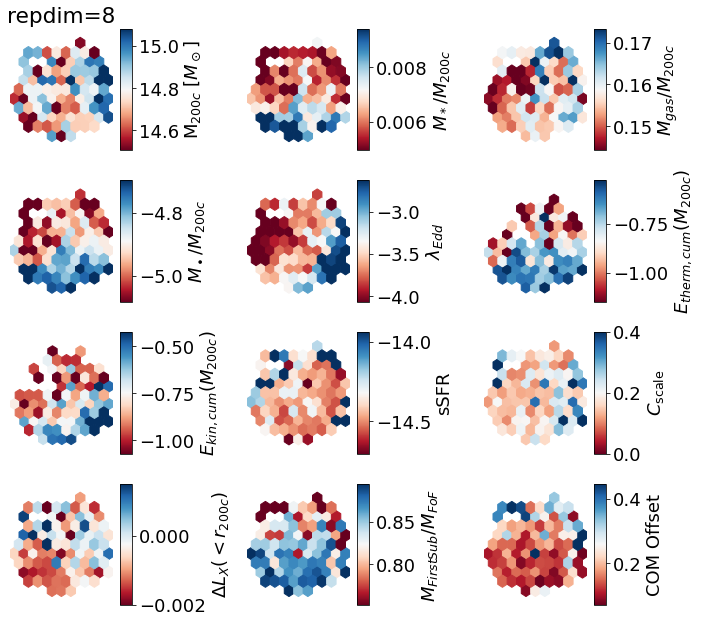

In [49]:
vmin = {'Cscale':0}
vmax = {'Cscale':0.4}
fig, ax = plt.subplots(nrows = 4, ncols = 3, sharex = True, sharey = True, figsize = (10,10))
plot_umaps('../../repdim=8/', ax.flatten(), fig, gridsize, label_human_dict,
           colorbar = True, nneighbours=50, mindist=0.75, snapnum=99,
           imname = '../../temp/umap_8dim_mnorm_nn50_md075_snap99.pdf', suffix="_train")

../../repdim=8/


/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/tmp/ipykernel_18271/2443099504.py:7: RuntimeWarning: divide by zero encountered in log10
  df[column] = np.log10(val0)
/tmp/ipykernel_18271/2443099504.py:7: RuntimeWarning: invalid value encountered in log10
  df[column] = np.log10(val0)


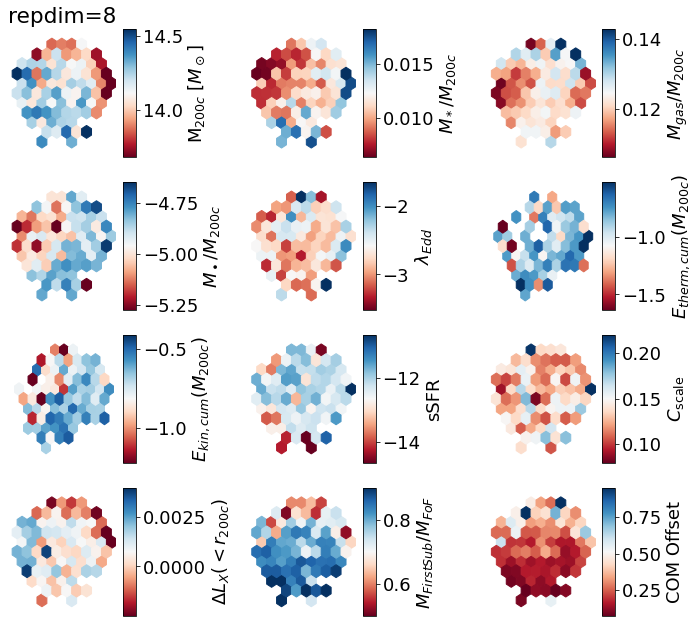

In [39]:
fig, ax = plt.subplots(nrows = 4, ncols = 3, sharex = True, sharey = True, figsize = (10,10))
plot_umaps('../../repdim=8/', ax.flatten(), fig, gridsize, label_human_dict,
           colorbar = True, nneighbours=50, mindist=0.75, snapnum=50,
           imname = '../../temp/umap_8dim_mnorm_nn50_md075_snap50.pdf', suffix="_train")

In [13]:
def filter_on_prop_per_snap(cat, label, cut_pc = 84, cut_gtr = True):
    #below 1-sigma: cut_pc = 16, cut_gtr = False

    prop = cat[label]
    cut = np.nanpercentile(prop, cut_pc)
    if cut_gtr:
        mask = prop > cut
    else:
        mask = prop < cut
    filtered_cat = cat[mask]
    return filtered_cat

def filter_on_prop(cat, label, cut_pc = 84, cut_gtr = True):
    for snap in snaps:
        sub = cat[cat['snapshot_id'] == snap]
        if snap == snaps[0]:
            filt_cat = filter_on_prop_per_snap(sub, label,cut_pc, cut_gtr)
        else:
            new_filt_cat = filter_on_prop_per_snap(sub, label, cut_pc, cut_gtr)
            filt_cat = pd.concat([filt_cat, new_filt_cat], axis=0)
    return filt_cat

In [30]:
def plot_umaps_from_cat(df, u, axis_column, fig, gridsize, label_list, imname, colorbar=False,
                        suffix='', snapnum=None):
        
    #snap and property masks
    if snapnum:
        mask = (df['snapshot_id'].values.astype(int) == snapnum)
        df = df[mask]
        u = u[mask]
    
    i = 0
    for label in label_list:
        im = get_hexbin(df, label, axis_column[i], u, gridsize=gridsize) 
        
        if colorbar:
            plt.colorbar(im, label=label_human_dict[label], ax = axis_column[i], aspect=10)
        axis_column[i].axis('off')
        if not i:
            axis_column[i].set_title(name)#, transform=axis_column[i].transAxes)
        plt.tight_layout(rect=(0,0,1,1))
        fig.savefig(imname)
        i += 1
    plt.show()

In [ ]:
df = pd.read_csv('../../fiducial/dataset/m_train.csv')
add_data(df)
log_columns(df)
high_bhar_mask = filter_on_prop(df, 'bh_accr', cut_pc=84, cut_gtr=True) 
low_bhar_mask = filter_on_prop(df, 'bh_accr', cut_pc=16, cut_gtr=False) 
no_recent_merger_mask = filter_on_prop(df, 'time_since_last_major_merger', cut_pc=84, cut_gtr=True) 
recent_merger_mask = filter_on_prop(df, 'time_since_last_major_merger', cut_pc=16, cut_gtr=False) 
high_com_offset_mask = filter_on_prop(df, 'Distance_Criterion', cut_pc=84, cut_gtr=True) 
low_com_offset_mask = filter_on_prop(df, 'Distance_Criterion', cut_pc=16, cut_gtr=False) 

In [ ]:
u = get_umap('../../repdim=8/', suffix='_train', n_neighbors=50, min_dist=0.75)

fig, ax = plt.subplots(nrows = 5, ncols = 3, sharex = True, sharey = True, figsize = (10,12))
plot_umaps_from_cat(high_bhar_mask, u[high_bhar_mask.index], ax.flatten(), fig, gridsize, label_list[:-1], colorbar = True,
               imname = '../../temp/umap_8dim_m200cnorm_nn50_md075_highbhar.pdf')

In [ ]:
fig, ax = plt.subplots(nrows = 5, ncols = 3, sharex = True, sharey = True, figsize = (10,12))
plot_umaps_from_cat(low_bhar_mask, u[low_bhar_mask.index], ax.flatten(), fig, gridsize, label_list[:-1], colorbar = True,
               imname = '../../temp/umap_8dim_m200cnorm_nn50_md075_lowbhar.pdf')

In [ ]:
fig, ax = plt.subplots(nrows = 5, ncols = 3, sharex = True, sharey = True, figsize = (10,12))
plot_umaps_from_cat(recent_merger_mask, u[recent_merger_mask.index], ax.flatten(), fig, gridsize, label_list[:-1], colorbar = True,
               imname = '../../temp/umap_8dim_m200cnorm_nn50_md075_recentmerger.pdf')

In [ ]:
fig, ax = plt.subplots(nrows = 5, ncols = 3, sharex = True, sharey = True, figsize = (10,12))
plot_umaps_from_cat(no_recent_merger_mask, u[no_recent_merger_mask.index], ax.flatten(), fig, gridsize, label_list[:-1], colorbar = True,
               imname = '../../temp/umap_8dim_m200cnorm_nn50_md075_norecentmerger.pdf')

In [ ]:
fig, ax = plt.subplots(nrows = 5, ncols = 3, sharex = True, sharey = True, figsize = (10,12))
plot_umaps_from_cat(high_com_offset_mask, u[high_com_offset_mask.index], ax.flatten(), fig, gridsize, label_list[:-1], colorbar = True,
               imname = '../../temp/umap_8dim_m200cnorm_nn50_md075_highcomoffset.pdf')

In [ ]:
fig, ax = plt.subplots(nrows = 5, ncols = 3, sharex = True, sharey = True, figsize = (10,12))
plot_umaps_from_cat(low_com_offset_mask, u[low_com_offset_mask.index], ax.flatten(), fig, gridsize, label_list[:-1], colorbar = True,
               imname = '../../temp/umap_8dim_m200cnorm_nn50_md075_lowcomoffset.pdf')

In [ ]:
for snapshot in np.unique(df['snapshot_id']):
    fig, ax = plt.subplots(nrows = 5, ncols = 3, sharex = True, sharey = True, figsize = (10,12))
    plot_umaps('../../repdim=8/', ax.flatten(), fig, gridsize, label_list[:-1], colorbar = True, nneighbours=50, mindist=0.75,
               imname = '../../temp/umap_8dim_m200cnorm_nn50_md075_snap%d.pdf' % int(snapshot), suffix="_train", snapnum=int(snapshot))

In [ ]:
def scatterplot(basePath, label, gridsize=10, ax=None, nneighbours=100, mindist=0.5, fig=None):
    #actually, why is this in the space of medians
    #i should just be binning in umap[:,0], umap[:,1]
    name = get_name(basePath)

    df = pd.read_csv(basePath+'/dataset/m_test.csv')
    add_data(df)
    log_columns(df)

    u = get_umap(basePath, n_neighbors=nneighbours, min_dist=mindist)
    if not ax:
        fig, ax = plt.subplots()
    if ("mass" in label) or ("bh" in label):
        color = df['d_'+label]
    else:
        color = df[label]
    norm = colors.Normalize(np.nanpercentile(color, 5), np.nanpercentile(color, 95))
    im = ax.scatter(u[:,0], u[:,1], c=color, cmap=cm.viridis, norm=norm)
    fig.colorbar(im, ax=ax)
    ax.set_title(label_human_dict[label])
    # plt.show()

In [ ]:
fig, ax = plt.subplots(nrows = np.round(len(label_list)/3).astype(int), ncols = 3, figsize = (10,12))
for i in range(len(ax.flatten())):
        scatterplot('../../repdim=8/', label_list[i], ax = ax.flatten()[i], fig=fig)
plt.tight_layout(rect = (0,0,1,1))
plt.savefig('umap-repdim8-scatterplots.png', dpi=192)
    

In [32]:
def get_u_mesh(u, NUM_IMAGES_PER_SIDE=24):
    u0 = np.linspace(np.min(u[:,0]), np.max(u[:,0]), num=NUM_IMAGES_PER_SIDE)
    u1 = np.linspace(np.min(u[:,1]), np.max(u[:,1]), num=NUM_IMAGES_PER_SIDE)
    
    u0v, u1v = np.meshgrid(u0, u1)
    return u0, u1, u0v, u1v

def get_filenames(basePath, mask=None, NUM_IMAGES_PER_SIDE = 24, nneighbours=100, mindist=0.5,MAX_DISTANCE = 1, suffix=''):
    df = pd.read_csv(basePath+'/dataset/m%s.csv' % suffix)
        
    u = get_umap(basePath, n_neighbors=nneighbours, min_dist=mindist, suffix=suffix)
    print(df.shape, u.shape)
    if not mask.any():
        mask = [True]*len(df)
    tree = cKDTree(u[mask,:], compact_nodes=False, balanced_tree=False)
    image_paths = df['image_path'][mask].to_numpy()

    _, _, u0v, u1v = get_u_mesh(u, NUM_IMAGES_PER_SIDE)
    filenames = np.empty_like(u0v, dtype=object)
    

    for i in range(NUM_IMAGES_PER_SIDE):
        for j in range(NUM_IMAGES_PER_SIDE):
            # m = dimension of 1 data point
            # k = number of neighbours we seek
            # if the tree is built on representation array (f), and f(i) is used in the query, the nearest neighbour is itself!
            # so ask for k > 1 neighbours, then consider k[1:]
            
            distance, index = tree.query([u0v[i,j], u1v[i,j]], k=[1], p=1, workers=-1)

            if distance < MAX_DISTANCE:
                filenames[i,j] = "../../" + image_paths[index][0]
            else:
                filenames[i,j] = ""
                
    return filenames


In [33]:
import matplotlib.pyplot as plt
from matplotlib.offsetbox import TextArea, DrawingArea, OffsetImage, AnnotationBbox
import numpy as np
from astropy.io import fits
from matplotlib import cm, colors

def load_image(filename, num_pixel=20, min='median', CROP = 0.05):
    
    def get_central_crop(img):
        size = img.shape[0]
        center_coordinate = size//2
        upper = center_coordinate + num_pixel//2
        lower = center_coordinate - num_pixel//2
    
        return img[lower:upper, lower:upper]
    
    def stretch(x):
        x[x<=0] = np.nan
        x = np.log10(x)
        x[x<-7] = np.nan
        
        if min == 'median':
            a_min = np.nanmedian(x)
        else:
            a_min = np.nanquantile(x, 0.05)
        a_max = np.nanquantile(get_central_crop(x), 0.99)
        
        x = np.nan_to_num(x, nan=a_min, posinf=a_min, neginf=a_min)
        x = np.clip(x, a_min, a_max)
        
        x -= a_min
        x /= (a_max - a_min)
        
        return np.array(x*(2**8 - 1), dtype=np.uint8)
    
    try:
        with fits.open(filename) as hdul:
            im = hdul['0.5-5.0'].data
    except:
        im = fits.getdata(filename)
        
    xlen, ylen = im.shape
    xmin = int( xlen/2. - CROP * xlen)
    xmax = int( xlen/2. + CROP * xlen)
    ymin = int( ylen/2. - CROP * ylen)
    ymax = int( ylen/2. + CROP * ylen)
    im = im[xmin:xmax, ymin:ymax]
        
    im = stretch(im)

    return (im[...,np.newaxis])

In [52]:
def plot_sorted_images(basePath, NUM_IMAGES_PER_SIDE = 24, CROP=0.5, TARGET_IMAGE_SIZE = 50, num_pixel = 20, 
                       mask=np.ones(10), min='median', suffix='_test', nneighbours=100, mindist=0.5, 
                       kde = False, figsize=(20,20), filename=None):
    name = basePath.replace('../','').replace('/','_')
    
    try:
        u = get_umap(basePath, n_neighbors=nneighbours, min_dist=mindist, suffix=suffix)
    except FileNotFoundError:
        u = get_umap(basePath, n_neighbors=nneighbours, min_dist=mindist, suffix='_test')

    if len(mask) == 10:
        mask = np.ones(len(u)).astype(bool)    
        try:
            filenames = get_filenames(basePath, NUM_IMAGES_PER_SIDE=NUM_IMAGES_PER_SIDE, MAX_DISTANCE=0.9*mindist,
                                  nneighbours=nneighbours, mindist=mindist, suffix=suffix, mask=mask)
        except FileNotFoundError:
            filenames = get_filenames(basePath, NUM_IMAGES_PER_SIDE=NUM_IMAGES_PER_SIDE, MAX_DISTANCE=0.9*mindist,
                                  nneighbours=nneighbours, mindist=mindist, suffix='_test', mask=mask)
    u = u[mask]
    u0, u1, u0v, u1v  = get_u_mesh(u, NUM_IMAGES_PER_SIDE=NUM_IMAGES_PER_SIDE)
    
    fig, ax = plt.subplots(figsize=figsize)

    PADDING = 0.5
    ax.set_xlim(u0[0]-PADDING, u0[-1]+PADDING)
    ax.set_ylim(u1[0]-PADDING, u1[-1]+PADDING)
    
    for i in range(NUM_IMAGES_PER_SIDE):
        for j in range(NUM_IMAGES_PER_SIDE):
            u0d = u0v[i,j]
            u1d = u1v[i,j]
            filename = filenames[i,j].replace('../../../','../../')

            if filename != "":
                im = load_image(filename, num_pixel, min=min, CROP=CROP)
                
                zoom_factor = TARGET_IMAGE_SIZE/im.shape[0]

                imagebox = OffsetImage(im, zoom=zoom_factor, cmap=cm.magma, norm=colors.Normalize(1, 255))
                ab = AnnotationBbox(imagebox, (u0d, u1d), frameon=False)
                ab.set_zorder(0)
                ax.add_artist(ab)
                ax.axis('off')
                
    if kde:
        sns.kdeplot(x=u[:,0], y=u[:,1], levels=4, thresh=0, linewidths=5, 
                color=cmap(basePath.index(basePath)))
    # plt.text(0.9, 0.9, name, color='k', size=48, transform=ax.transAxes)
    if not filename:
        filename = name + suffix 
    plt.savefig('../../temp/images_' + filename + '.pdf')
    plt.show()
    return fig, ax

In [50]:
ls -l ../../temp/images_*

-rw-r--r-- 1 uchadaya mia  598455 Feb 28 11:30  ../../temp/images_T.pdf
-rw-r--r-- 1 uchadaya mia 1676799 May  3 17:02  ../../temp/images_fiducial.pdf
-rw-r--r-- 1 uchadaya mia  951081 Apr  9 13:21  ../../temp/images_fiducial_blur.pdf
-rw-r--r-- 1 uchadaya mia  792577 Apr 12 15:52  ../../temp/images_fiducial_clip.pdf
-rw-r--r-- 1 uchadaya mia  783119 Apr 24 13:26  ../../temp/images_fiducial_clip_core.pdf
-rw-r--r-- 1 uchadaya mia  941657 Apr  8 15:05  ../../temp/images_fiducial_core.pdf
-rw-r--r-- 1 uchadaya mia 1580131 May  3 13:03  ../../temp/images_fiducial_test.pdf
-rw-r--r-- 1 uchadaya mia 2450970 Apr 24 14:52  ../../temp/images_fiducial_train.pdf
-rw-r--r-- 1 uchadaya mia 1635261 Apr 24 16:44  ../../temp/images_fiducial_val.pdf
-rw-r--r-- 1 uchadaya mia  852649 Mar  6 18:08  ../../temp/images_halfdata.pdf
-rw-r--r-- 1 uchadaya mia  970212 Mar  6 18:09  ../../temp/images_halfresneprojdim.pdf
-rw-r--r-- 1 uchadaya mia  902298 Mar  6 18:09  ../../temp/images_halfresnetdepth.pdf
-rw-

/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


(772, 12) (772, 2)


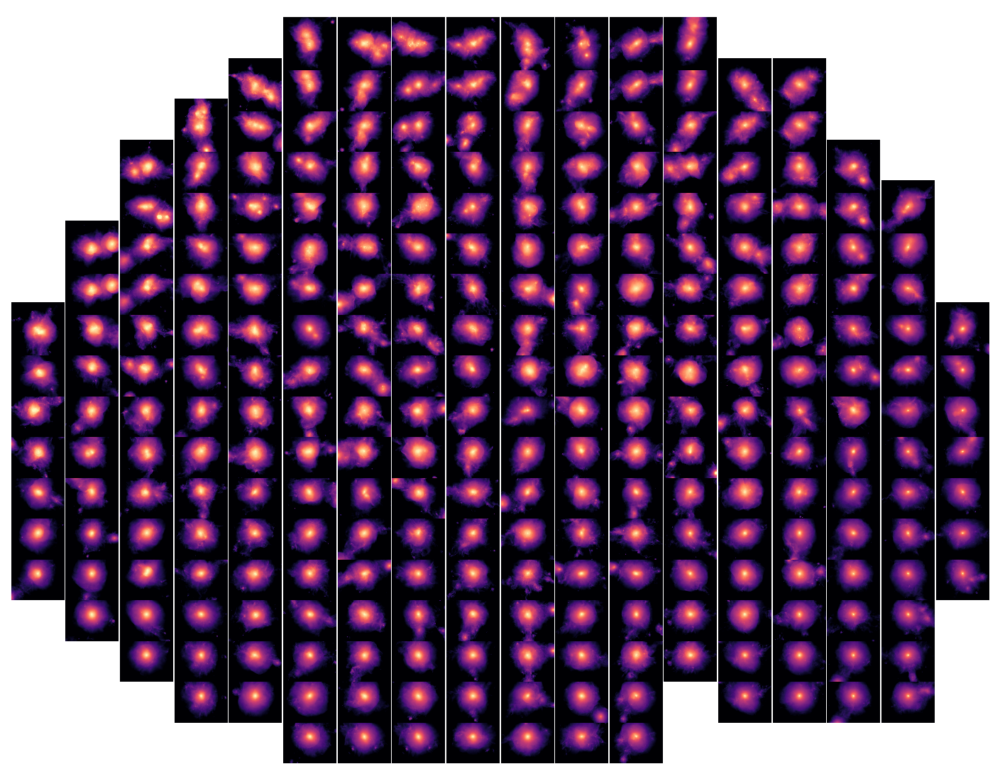

In [53]:
# !ln -s ../../repdim\=8/dataset/m_test.csv ../../repdim\=8/dataset/m.csv # for basePath in basePaths:
fig, ax = plot_sorted_images('../../repdim=8/',suffix='', NUM_IMAGES_PER_SIDE=18, TARGET_IMAGE_SIZE=75, nneighbours=50,mindist=.75, 
                   figsize=(25,20), filename='repdim8')
fig.savefig('../../temp/images_repdim=8_.pdf')

/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


(6412, 12) (6412, 2)


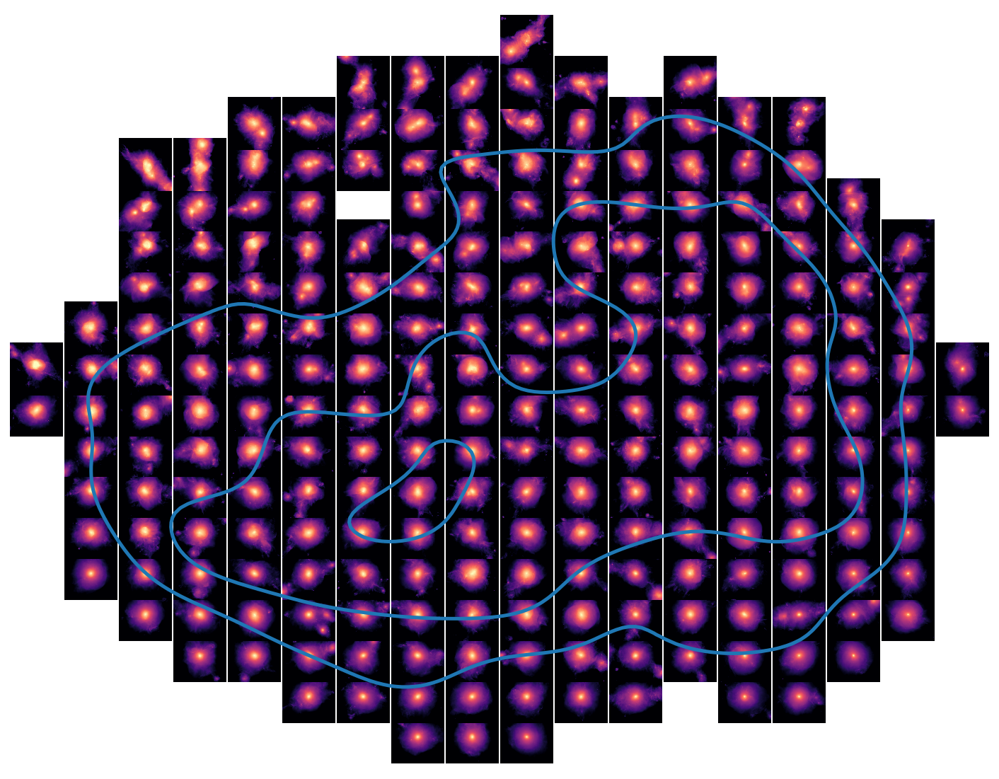

In [161]:
# !ln -s ../../repdim=16/postprocessing/representation.npy ../../repdim=16/postprocessing/representation_test.npy
# for basePath in basePaths:
plot_sorted_images('../../repdim=8/', suffix='_train', NUM_IMAGES_PER_SIDE=18, TARGET_IMAGE_SIZE=75, nneighbours=50,mindist=.25, figsize=(25,20), filename='repdim8')

/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


(6412, 12) (6412, 2)


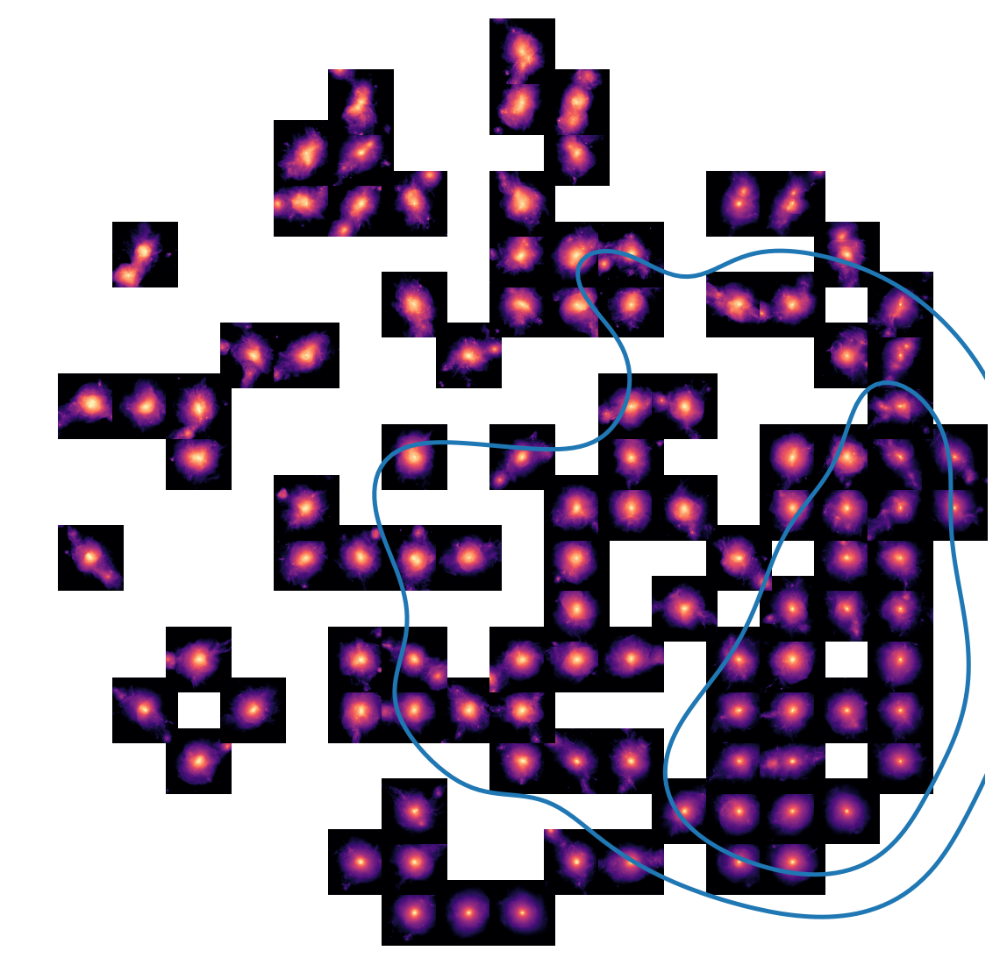

In [162]:
plot_sorted_images('../../repdim=8/',  NUM_IMAGES_PER_SIDE=18, TARGET_IMAGE_SIZE=75, nneighbours=50,
                   mindist=.25, suffix='_train', mask=high_bhar_mask.index, filename='repdim8_highbhar')

/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


(6412, 12) (6412, 2)


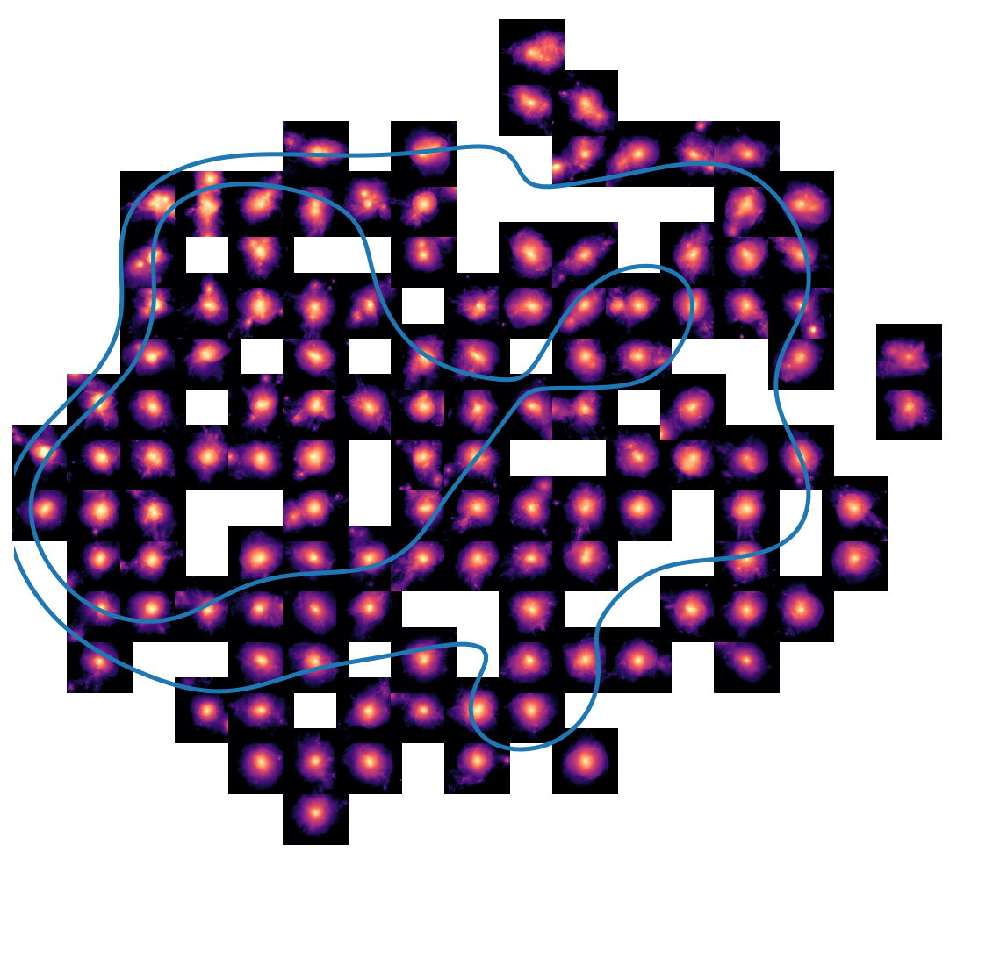

In [163]:
plot_sorted_images('../../repdim=8/',  NUM_IMAGES_PER_SIDE=18, TARGET_IMAGE_SIZE=75, nneighbours=50,
                   mindist=.25, suffix='_train', mask=low_bhar_mask.index, filename='repdim8_lowbhar')

/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


(6412, 12) (6412, 2)


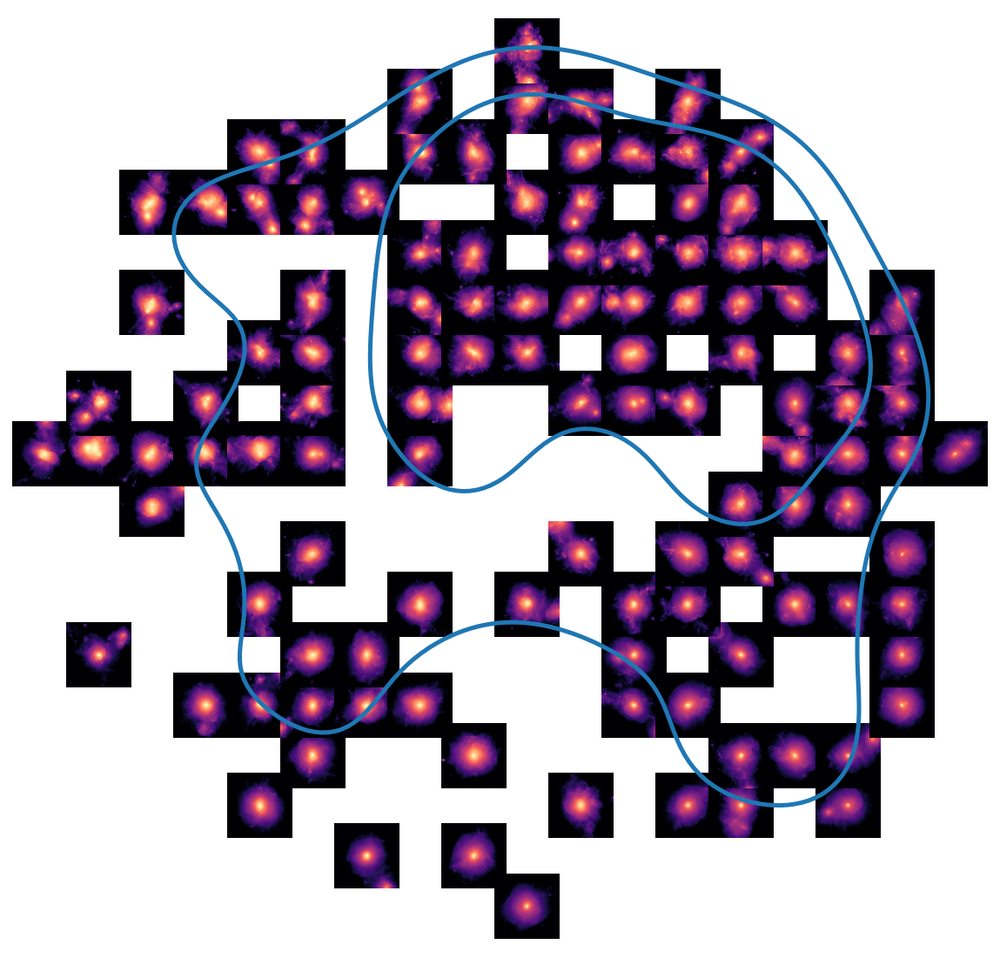

In [164]:
plot_sorted_images('../../repdim=8/',  NUM_IMAGES_PER_SIDE=18, TARGET_IMAGE_SIZE=75, nneighbours=50,
                   mindist=.25, suffix='_train', mask=recent_merger_mask.index, filename='repdim8_recentmerger')

/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


(6412, 12) (6412, 2)


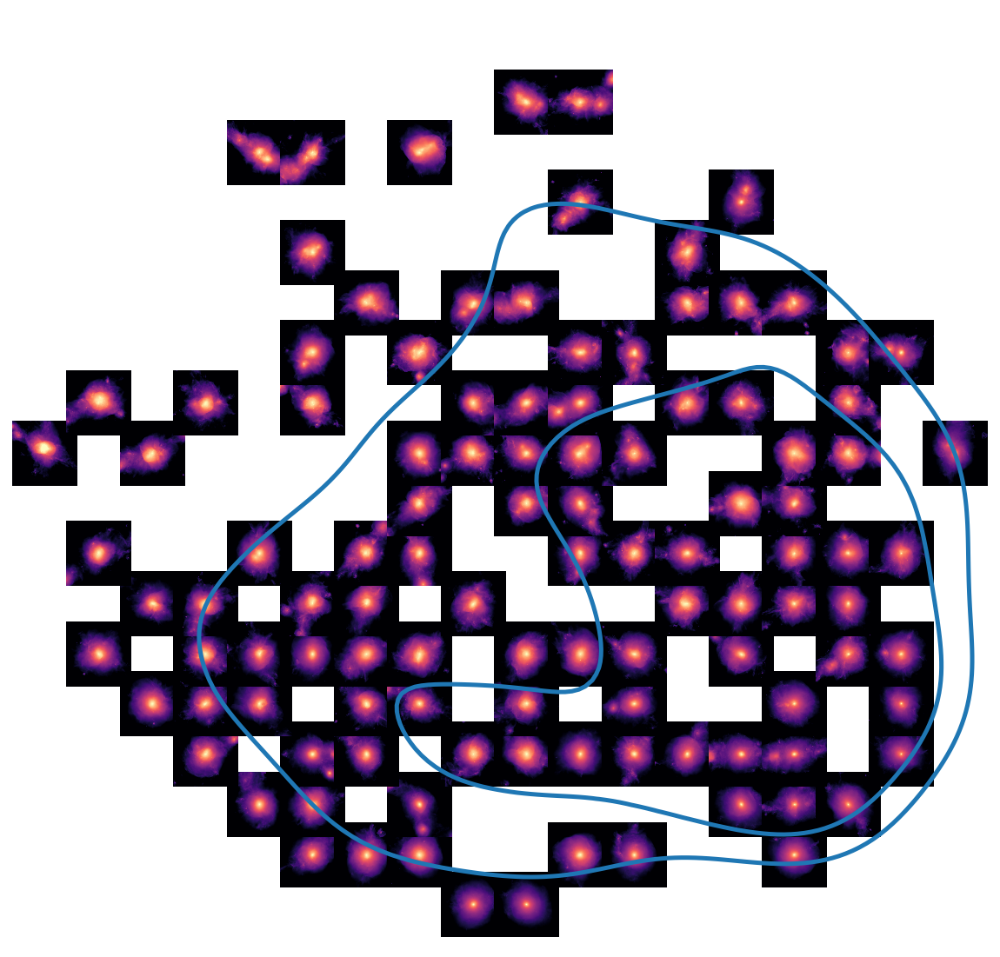

In [165]:
plot_sorted_images('../../repdim=8/',  NUM_IMAGES_PER_SIDE=18, TARGET_IMAGE_SIZE=75, nneighbours=50,
                   mindist=.25, suffix='_train', mask=no_recent_merger_mask.index, filename='repdim8_norecentmerger')

/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


(6412, 12) (6412, 2)


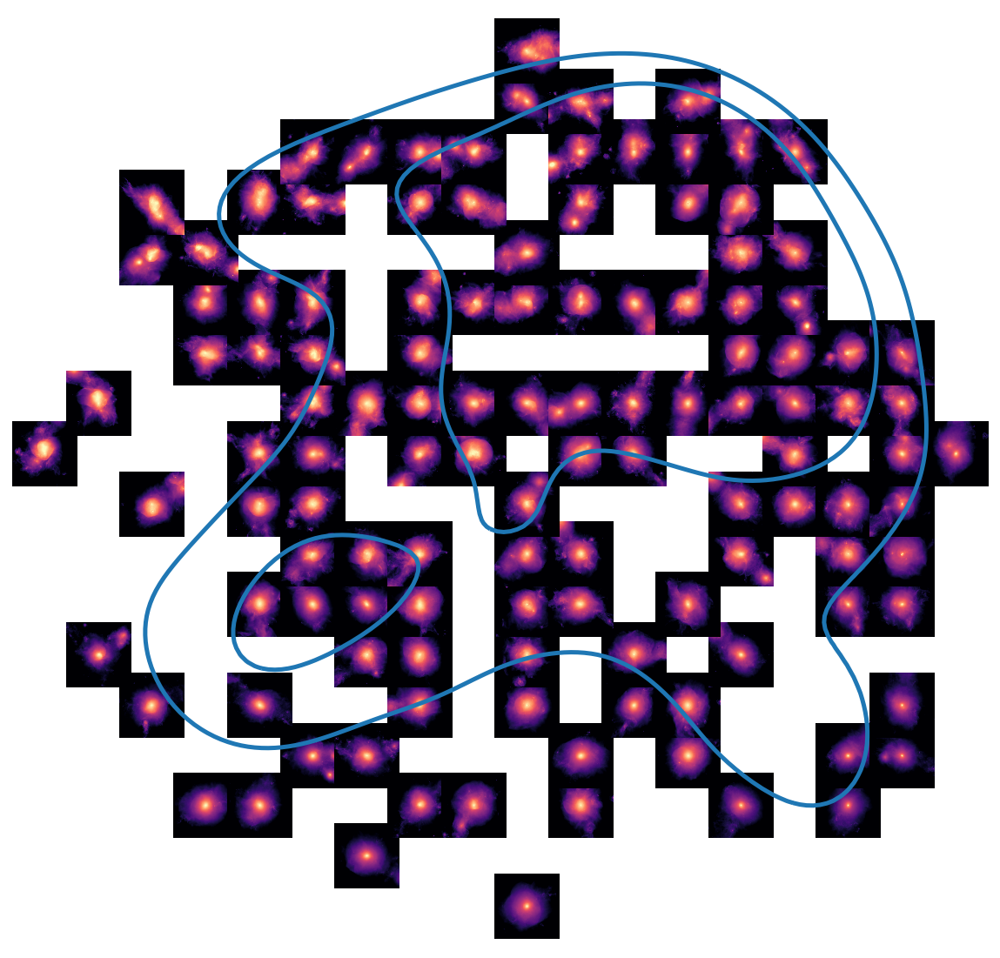

In [166]:
plot_sorted_images('../../repdim=8/',  NUM_IMAGES_PER_SIDE=18, TARGET_IMAGE_SIZE=75, nneighbours=50,
                   mindist=.25, suffix='_train', mask=high_com_offset_mask.index, filename='repdim8_highcomoffset')

/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


(6412, 12) (6412, 2)


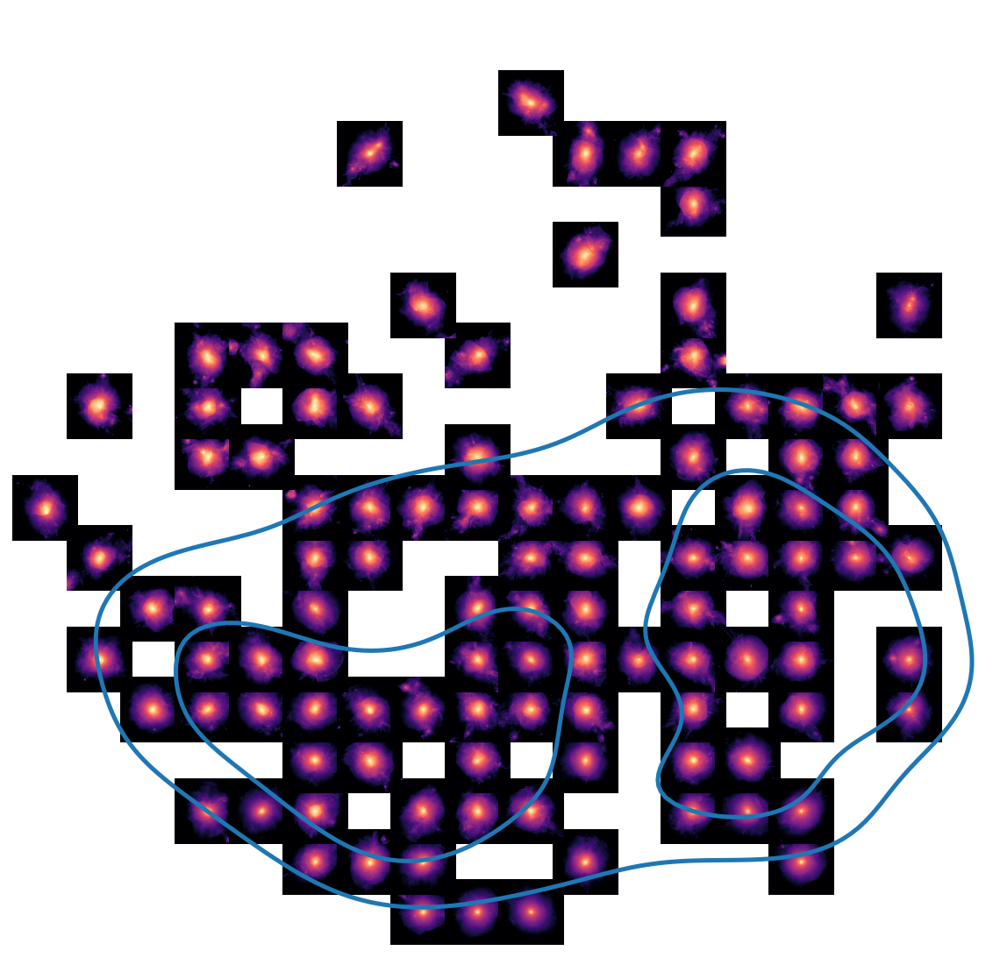

In [167]:
plot_sorted_images('../../repdim=8/',  NUM_IMAGES_PER_SIDE=18, TARGET_IMAGE_SIZE=75, nneighbours=50,
                   mindist=.25, suffix='_train', mask=low_com_offset_mask.index, filename='repdim8_lowcomoffset')

In [7]:
basePath = '../../repdim=8/'
u = get_umap(basePath, n_neighbors=50, min_dist=0.25, suffix='')

/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [8]:
from matplotlib import lines

def plot_kde_subset(u, ax, color, label, mask):
    name = basePath.replace('../','').replace('/','_')

    u = u[mask,:]
    
    sns.kdeplot(x=u[:,0], y=u[:,1], levels=[0.25, 0.50, 0.75, 1.0], thresh=0, linewidths=1, 
                color=color, label= label, ax=ax, fill=True, alpha=0.75)

    ax.axis('off')

In [25]:
def make_masks(df, prop):
    high_mask = filter_on_prop(df, prop, cut_pc=84, cut_gtr=True) 
    low_mask = filter_on_prop(df, prop, cut_pc=16, cut_gtr=False) 
    return high_mask, low_mask

def plot_split_kdes(df, u, props, fig, ax, fontsize=14, dict=label_human_dict):

    for prop in props:
        ind = props.index(prop)
        high_mask, low_mask = make_masks(df, prop)
        plot_kde_subset(u, ax=ax.flatten()[ind], color='tab:orange', label=r'$\mu + 1\sigma$', mask=high_mask.index)
        plot_kde_subset(u, ax=ax.flatten()[ind], color='tab:blue',  label = r'$\mu - 1\sigma$', mask=low_mask.index)
    if fontsize:
        for i in range(len(props)):
            ax.flatten()[i].set_title(label_human_dict[props[i]], fontsize=fontsize)
    plt.show()

In [40]:
add_data(df)
log_columns(df)

/tmp/ipykernel_27436/4288295719.py:5: RuntimeWarning: invalid value encountered in log10
  df[column] = np.log10(val0)


/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/sea

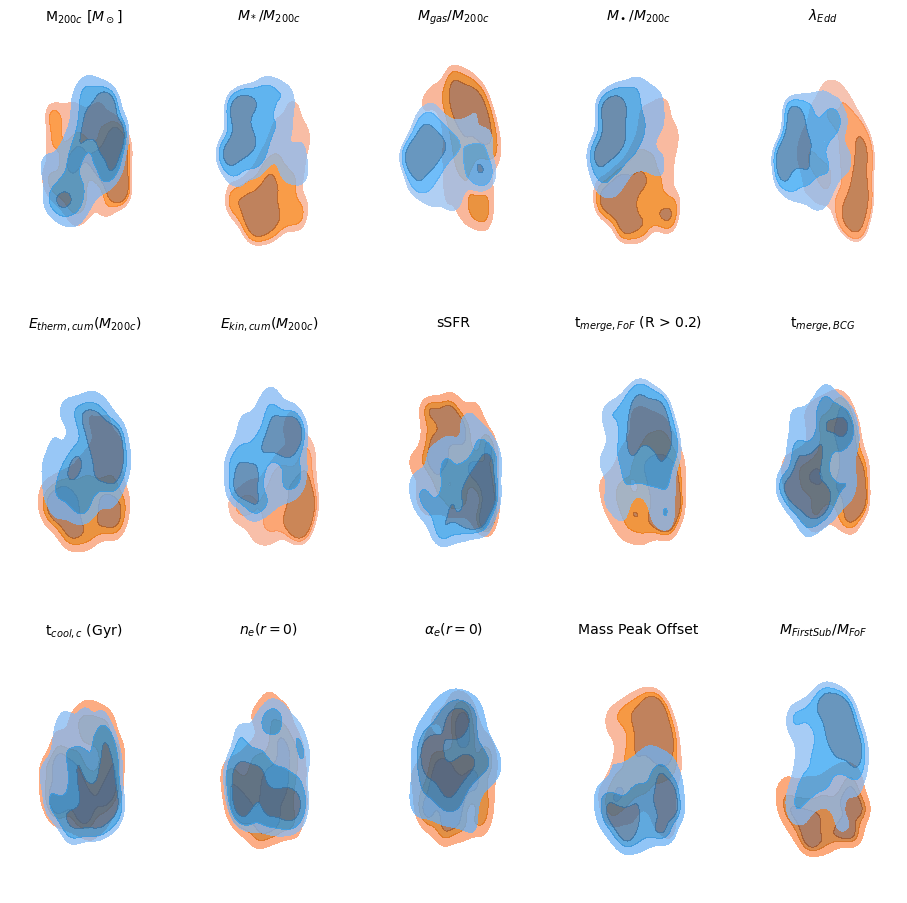

<Figure size 432x288 with 0 Axes>

In [59]:
snaps = np.unique(df['snapshot_id'])
label_list = [key for key in label_human_dict]
fig, ax = plt.subplots(nrows=3, ncols=5, sharex=True, sharey=True, figsize=(16,16))
plot_split_kdes(df, u, fig=fig, ax=ax, props = label_list[1:], dict=label_human_dict)
plt.tight_layout()
plt.savefig('../../temp/kde_by_properties.png')

In [47]:
df = pd.read_csv('../../fiducial/dataset/m_train.csv')
add_data(df)
log_columns(df)
u = get_umap(basePath, n_neighbors=50, min_dist=0.25, suffix='_train')

/tmp/ipykernel_27436/4288295719.py:5: RuntimeWarning: divide by zero encountered in log10
  df[column] = np.log10(val0)
/tmp/ipykernel_27436/4288295719.py:5: RuntimeWarning: invalid value encountered in log10
  df[column] = np.log10(val0)
/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [51]:
snaps = np.unique(df['snapshot_id'])
label_list = [key for key in label_human_dict]
cat99 = df[df['snapshot_id'] == 99]
u99 = u[cat99.index]
cat99.index = np.arange(len(u99))

/u/uchadaya/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1366: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/u/uchadaya/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1366: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:

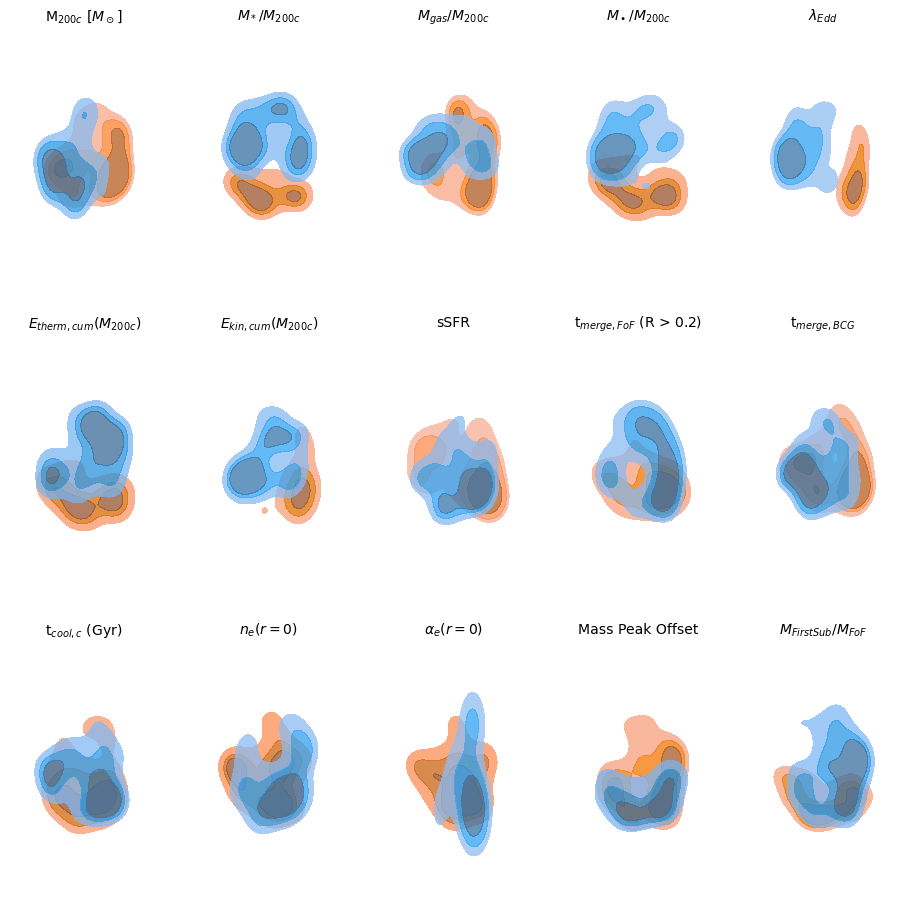

<Figure size 432x288 with 0 Axes>

In [58]:
fig, ax = plt.subplots(nrows=3, ncols=5, sharex=True, sharey=True, figsize=(16,16))
plot_split_kdes(cat99, u99, fig=fig, ax=ax, props = label_list[1:], dict=label_human_dict)
plt.tight_layout()
plt.savefig('../../temp/kde_by_properties_snap99.png')

In [260]:
snaps = np.unique(df['snapshot_id'])

def plot_kde_snap(df, u, filename, fontsize=18, label_list = label_list, snaps=snaps):
    fig, ax = plt.subplots(nrows = len(snaps), ncols=len(label_list), sharex=True, sharey=True, figsize=(3*len(label_list),5*len(snaps)))
    i = 0
    for snap in snaps:
        snapmask = (df['snapshot_id'] == snap)
        snap_df = df[snapmask]
        snap_df.index = np.arange(len(snap_df))
        if not i:
            plot_split_kdes(snap_df, u[snapmask], label_list, fig, ax[i], fontsize)
        else:
            plot_split_kdes(snap_df, u[snapmask], label_list, fig, ax[i], fontsize=None)
        xlim = ax[i,0].get_xlim()
        ylim = ax[i,0].get_ylim()
        xtext = xlim[0] + 0.2 * (xlim[1] - xlim[0])
        ytext = ylim[0] + 0.2 * (ylim[1] - ylim[0])
        i += 1
    fig.savefig(filename, dpi=192)
    return fig, ax

/u/uchadaya/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1366: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/u/uchadaya/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1366: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:

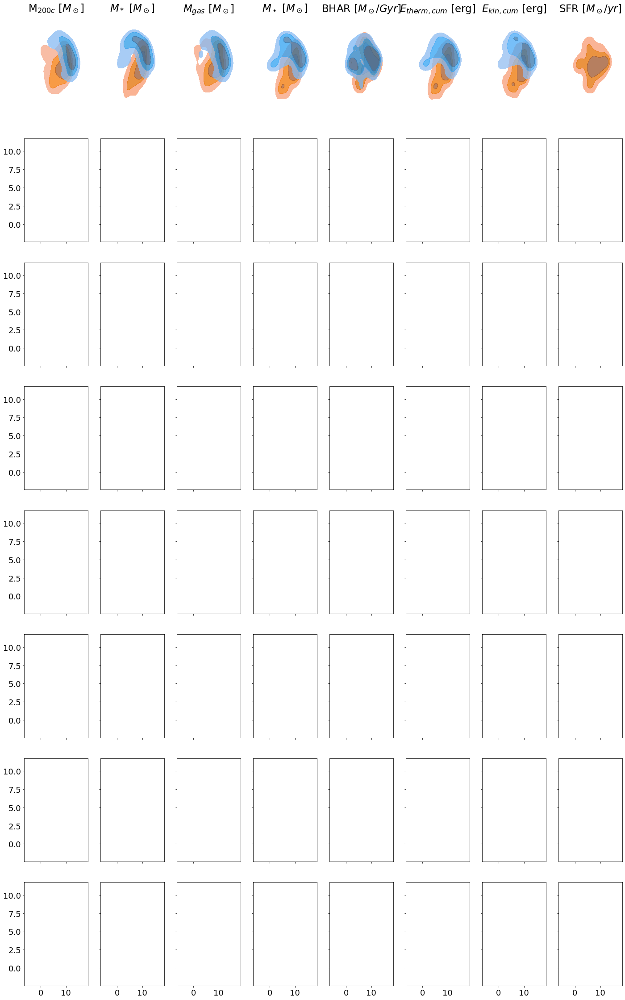

/u/uchadaya/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1366: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/u/uchadaya/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1366: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:

/u/uchadaya/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1366: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/u/uchadaya/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1366: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:

/u/uchadaya/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1366: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/u/uchadaya/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1366: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:

/u/uchadaya/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1366: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/u/uchadaya/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1366: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:

In [271]:
filename = '../../temp/kde_by_mass_sfr_bh.png'
fig, ax = plot_kde_snap(df, u, filename, fontsize=23, label_list = label_list[1:9])
for i in range(len(ax)):
    ax[i,0].text(-2, 0, 'snap %d' % snaps[i], fontsize=24)
ax[0][0].set_xlim(-2.5,16)
ax[0][0].set_ylim(-0.9,9.5)
fig.savefig(filename)

/u/uchadaya/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1366: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/u/uchadaya/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1366: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:

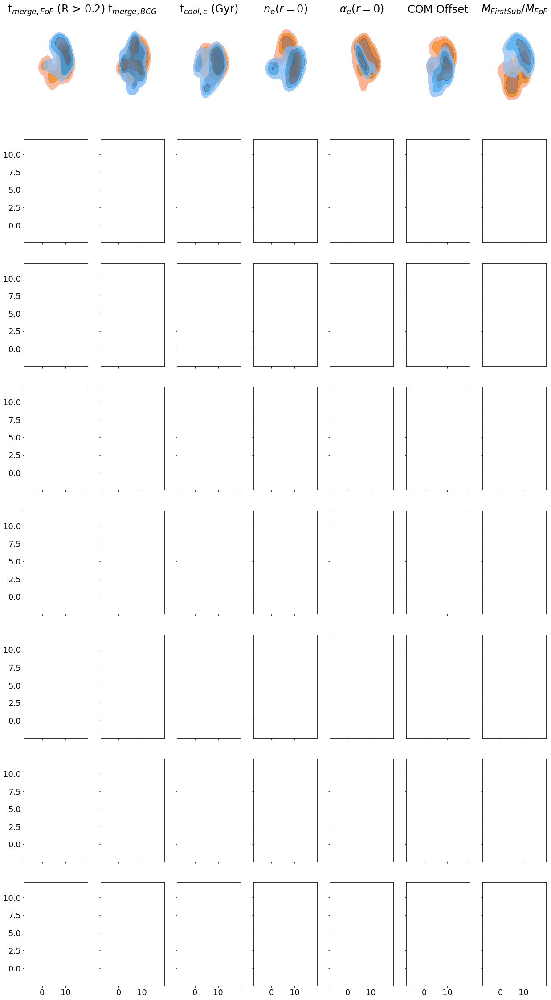

/u/uchadaya/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1366: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/u/uchadaya/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1366: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/u/uchadaya/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1366: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/u/uchadaya/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1366: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/u/uchadaya/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1366: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/u/uchadaya/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1366: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:

/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/u/uchadaya/.local/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1366: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(
/mpcdf/soft/SLE_15/packages/x86_64/anaconda/3/2021.11/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: linewidths is ignored by contourf
  cset = contour_func(


In [270]:
filename = '../../temp/kde_by_core_merger_properties.png'
fig, ax = plot_kde_snap(df, u, filename, fontsize=24, label_list = label_list[9:])
for i in range(len(ax)):
    ax[i,0].text(-2, 0, 'snap %d' % snaps[i], fontsize=24)
ax[0][0].set_xlim(-2.5,16)
ax[0][0].set_ylim(-0.9,9.5)
fig.savefig(filename)

In [137]:
#analogue finder
def get_analogues_umap(image_num, basePath, n_neighbours = 5, umap_nn=100, umap_md=0.5):
    df = pd.read_csv(basePath+'/dataset/m_test.csv')
    u = get_umap(basePath, n_neighbors=umap_nn, min_dist=umap_md)
    tree = cKDTree(u, compact_nodes=False, balanced_tree=False)
    image_paths = df['image_path'].to_numpy()

    filenames = []

    distance, index = tree.query(u[image_num], k=n_neighbours+1, p=1, workers=-1)

    for ind in index: #the 0th neighbour is itself
        filenames.append('/vera/ptmp/gc/uchadaya/ContrastiveLearning/simclr-gas/'+image_paths[ind].replace('../',''))
                
    # return filenames
    return df.iloc[index]

In [129]:
#analogue finder
def get_analogues_rep(image_num, basePath, suffix = '', n_neighbours = 5):
    if not suffix:
        df = pd.read_csv(basePath+'/dataset/m_test.csv')
    else:
        df = pd.read_csv(basePath+'/dataset/m%s.csv' % suffix)
    with open(basePath+'postprocessing/representation%s.npy' % suffix, 'rb') as f:
        rep = np.load(f)
    tree = cKDTree(rep, compact_nodes=False, balanced_tree=False)
    image_paths = df['image_path'].to_numpy()

    filenames = []

    distance, index = tree.query(rep[image_num], k=n_neighbours+1, p=1, workers=-1)

    for ind in index: #the 0th neighbour is itself
        filenames.append('/vera/ptmp/gc/uchadaya/ContrastiveLearning/simclr-gas/'+image_paths[ind].replace('../',''))
                
    # return filenames
    return df.iloc[index]

In [138]:

def plot_one_image(matches, index, axis, image_dir = "../../", return_norm = False, norm=None, cmap=cm.magma):
    im = fits.getdata(image_dir+matches['image_path'].iloc[index].replace('../',''))
    if not norm:
        norm = colors.Normalize(im.max()/1.3, im.max())
    axis.imshow(im, cmap=cmap, norm = norm)
    axis.text(25, 25, r'Halo ID = %d' % matches['halo_num'].iloc[index], color='w')
    axis.text(25, 225, r'M$_{200c}$ = %0.1e $M_\odot$' % matches['m200c'].iloc[index], color='w')
    axis.text(25, 250, r't$_{merge}$ = %0.1f' % matches['time_since_last_major_merger'].iloc[index], color='w')
    if return_norm:
        return norm
    
def plot_analogues(image_num, basePath, n_neighbours = 5, analogue_space='umap', suffix='', umap_nn=50, umap_md=0.75):
    if analogue_space == 'umap':
        matches = get_analogues_umap(image_num, basePath, n_neighbours=n_neighbours, umap_nn=umap_nn, umap_md=umap_md)
    else:
        matches = get_analogues_rep(image_num, basePath, n_neighbours=n_neighbours)
    
    add_data(matches)
    matches.index = np.arange(len(matches)).astype(int)
    print(matches['halo_num'][0], matches['snapshot_id'][0])
    
    fig, ax = plt.subplots(ncols = n_neighbours, figsize = (20,4))
    ax = ax.flatten()
    if not suffix:
        df = pd.read_csv(basePath + '/dataset/m_test.csv')
    else:
        df = pd.read_csv(basePath + '/dataset/m%s.csv' % suffix)

    image_dir = basePaths[0]
    ax[0].set_title("Input")
    for i in range(n_neighbours):
        plot_one_image(matches, i, ax[i])
        if i:
            ax[i].set_title("Analogue # %d" % (i))
    plt.show()

/vera/u/uchadaya/miniforge3/envs/cluster_generator/lib/python3.12/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


5708035.0 50.0


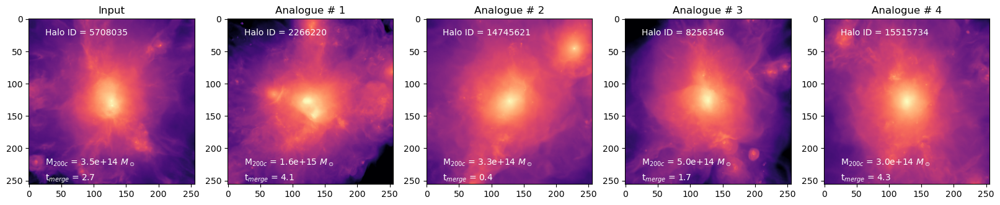

In [135]:
plot_analogues(10, '../../repdim=16/')
#now also print their properties

/vera/u/uchadaya/miniforge3/envs/cluster_generator/lib/python3.12/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


5708035.0 50.0


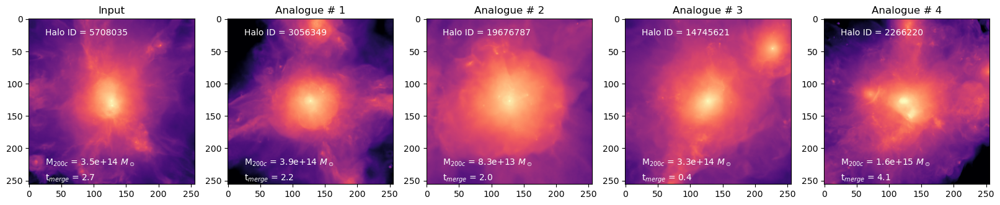

In [139]:
plot_analogues(10, '../../repdim=16/', umap_nn=50, umap_md=.75)
#now also print their properties

/vera/u/uchadaya/miniforge3/envs/cluster_generator/lib/python3.12/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


5708035.0 50.0


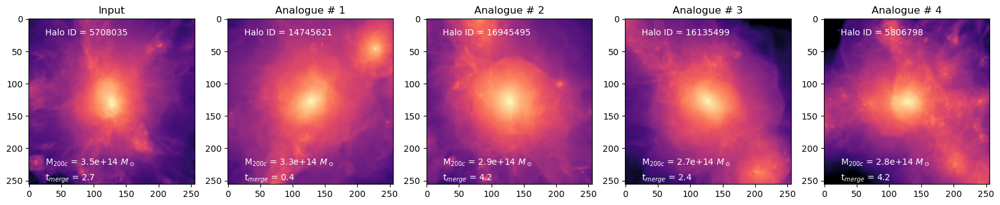

In [141]:
plot_analogues(10, '../../repdim=16/', umap_nn=20, umap_md=.25)
#now also print their properties

5708035.0 50.0


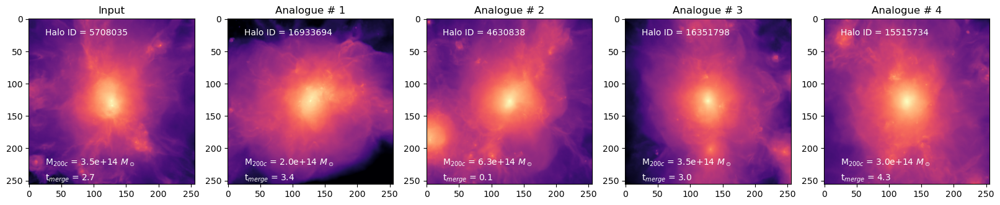

In [136]:
plot_analogues(10, '../../repdim=16/', analogue_space='rep')
